# KLASYFIKATOR WSPOMAGAJĄCY DIAGNOZĘ RAKA (Breast Cancer Wisconsin)

# Load and analyze data

In [227]:
import numpy as np
from sklearn import datasets
patients = datasets.load_breast_cancer()

In [228]:
print(patients.DESCR)

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 569

    :Number of Attributes: 30 numeric, predictive attributes and the class

    :Attribute Information:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry 
        - fractal dimension ("coastline approximation" - 1)

        The mean, standard error, and "worst" or largest (mean of the three
        largest values) of these features were computed for each image,
        resulting in 30 features.  For instance, field 3 is Mean Radius, f

In [229]:
print(patients.data.shape)
print(patients.target.shape)

(569, 30)
(569,)


KOMENTARZ: Suma elementów zbioru treningowego i testującego wynosi 569, a liczba etykiet (cech) wynosi 30.

In [230]:
print("First patient in database")
print(patients['data'][0,:])

First patient in database
[1.799e+01 1.038e+01 1.228e+02 1.001e+03 1.184e-01 2.776e-01 3.001e-01
 1.471e-01 2.419e-01 7.871e-02 1.095e+00 9.053e-01 8.589e+00 1.534e+02
 6.399e-03 4.904e-02 5.373e-02 1.587e-02 3.003e-02 6.193e-03 2.538e+01
 1.733e+01 1.846e+02 2.019e+03 1.622e-01 6.656e-01 7.119e-01 2.654e-01
 4.601e-01 1.189e-01]


In [231]:
print(patients['target'][0])

0


KOMENTARZ: Powyżej zostały wyświetlone dane o pacjencie numer 1. W macierzy znajdują się wartości dla poszczególnych etykiet, a klasa, do której należy ten pacjent to 0 - zatem ma on łagodną zmianę rakową.

# EXPLORATORY ANALYSIS

In [232]:
import pandas as pd
patients_data_p = pd.DataFrame(patients.data, columns=[patients.feature_names])
patients_data_p.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


KOMENTARZ: Powyżej zostały wyświetlone wartości poszczególnych 30 etykiet dla pierwszych 5 pacjentów.

In [233]:
patients_data_p.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


KOMENTARZ: Powyżej został wyświetlony opis dla poszczególnych 30 etykiet. Na przykład dla średniego promienia zmiany rakowej (mean radius), wartość minimalna wynosi 6,981000, a wartość maksymalna wynosi 28,110000.

D:\Python\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


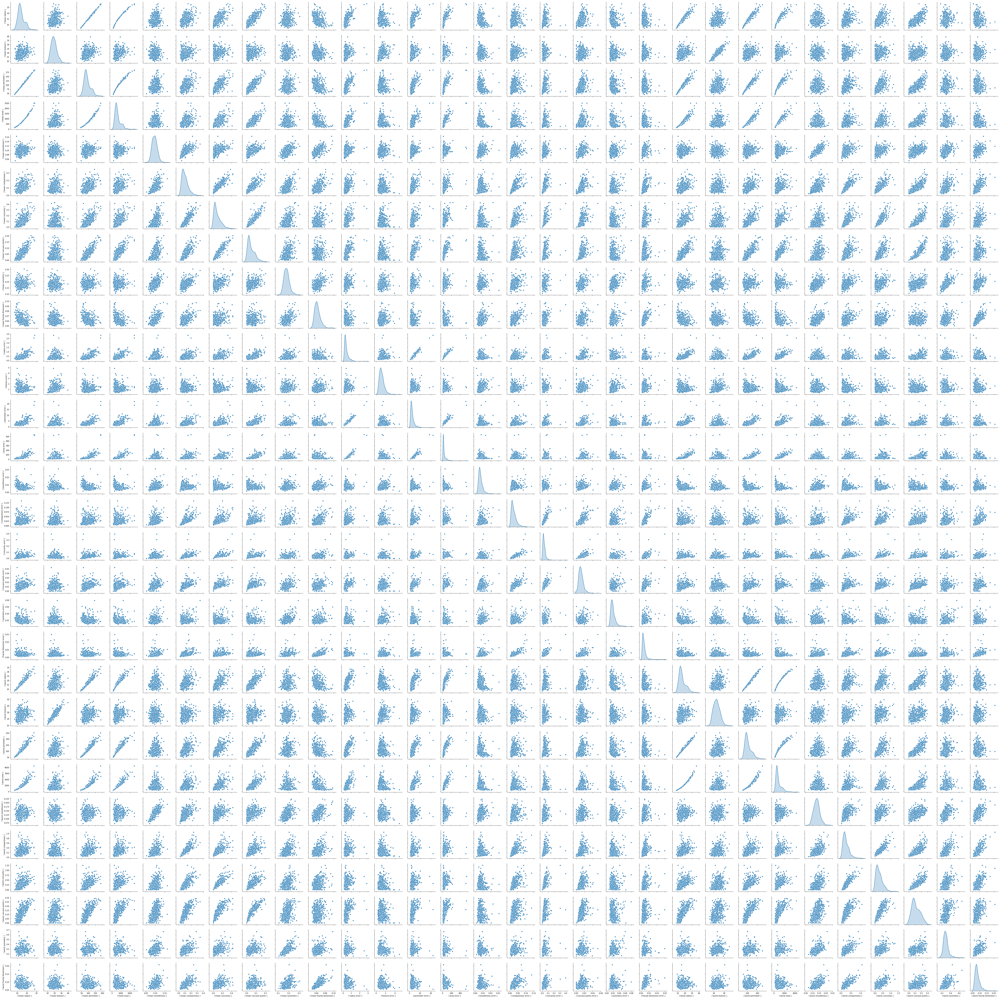

In [208]:
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sb

#sb.pairplot(patients_data_p, diag_kind="kde")
sb_plot = sb.pairplot(patients_data_p, diag_kind="kde")
sb_plot.savefig("wykresy1.png")

KOMENTARZ: Szczegółowe wykresy dla naszych danych. Zawierają rozkłady wartości obiektów i korelacje etykiet. Wgląd do wszystkich wykresów może nam pomóc zaobserwować elementy odchodzące od normy.

# Data standardisation with StandardScaler

In [234]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_data = scaler.fit_transform(patients['data'])

KOMENTARZ: Dane na temat pacjentów zostały poddane standaryzacji. Dzięki standaryzacji dane będą znajdowały się w mniej więcej tej samej dziedzinie wartości (w tym samym przedziale liczbowym). Dane były bardzo rozbieżne, dlatego postanowiliśmy poddać je procesowi standaryzacji.
Poniżej wyświetlono ponownie szczegółowe dane dla poszczególnych etykiet. Jak widać znajdują się one w podobnej dziedzinie wartości.

In [235]:
import pandas as pd
patients_data_p_scaled = pd.DataFrame(scaled_data, columns=[patients.feature_names])
patients_data_p_scaled.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,2.255747,...,1.886690,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015
1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,-0.868652,...,1.805927,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190
2,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,-0.398008,...,1.511870,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391
3,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,4.910919,...,-0.281464,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010
4,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,-0.562450,...,1.298575,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100


In [236]:
patients_data_p_scaled.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,...,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02
mean,-3.162867e-15,-6.530609e-15,-7.078891e-16,-8.799835e-16,6.132177e-15,-1.120369e-15,-4.421380e-16,9.732500e-16,-1.971670e-15,-1.453631e-15,...,-2.333224e-15,1.763674e-15,-1.198026e-15,5.049661e-16,-5.213170e-15,-2.174788e-15,6.856456e-16,-1.412656e-16,-2.289567e-15,2.575171e-15
std,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,...,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00
min,-2.029648e+00,-2.229249e+00,-1.984504e+00,-1.454443e+00,-3.112085e+00,-1.610136e+00,-1.114873e+00,-1.261820e+00,-2.744117e+00,-1.819865e+00,...,-1.726901e+00,-2.223994e+00,-1.693361e+00,-1.222423e+00,-2.682695e+00,-1.443878e+00,-1.305831e+00,-1.745063e+00,-2.160960e+00,-1.601839e+00
25%,-6.893853e-01,-7.259631e-01,-6.919555e-01,-6.671955e-01,-7.109628e-01,-7.470860e-01,-7.437479e-01,-7.379438e-01,-7.032397e-01,-7.226392e-01,...,-6.749213e-01,-7.486293e-01,-6.895783e-01,-6.421359e-01,-6.912304e-01,-6.810833e-01,-7.565142e-01,-7.563999e-01,-6.418637e-01,-6.919118e-01
50%,-2.150816e-01,-1.046362e-01,-2.359800e-01,-2.951869e-01,-3.489108e-02,-2.219405e-01,-3.422399e-01,-3.977212e-01,-7.162650e-02,-1.782793e-01,...,-2.690395e-01,-4.351564e-02,-2.859802e-01,-3.411812e-01,-4.684277e-02,-2.695009e-01,-2.182321e-01,-2.234689e-01,-1.274095e-01,-2.164441e-01
75%,4.693926e-01,5.841756e-01,4.996769e-01,3.635073e-01,6.361990e-01,4.938569e-01,5.260619e-01,6.469351e-01,5.307792e-01,4.709834e-01,...,5.220158e-01,6.583411e-01,5.402790e-01,3.575891e-01,5.975448e-01,5.396688e-01,5.311411e-01,7.125100e-01,4.501382e-01,4.507624e-01
max,3.971288e+00,4.651889e+00,3.976130e+00,5.250529e+00,4.770911e+00,4.568425e+00,4.243589e+00,3.927930e+00,4.484751e+00,4.910919e+00,...,4.094189e+00,3.885905e+00,4.287337e+00,5.930172e+00,3.955374e+00,5.112877e+00,4.700669e+00,2.685877e+00,6.046041e+00,6.846856e+00


D:\Python\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


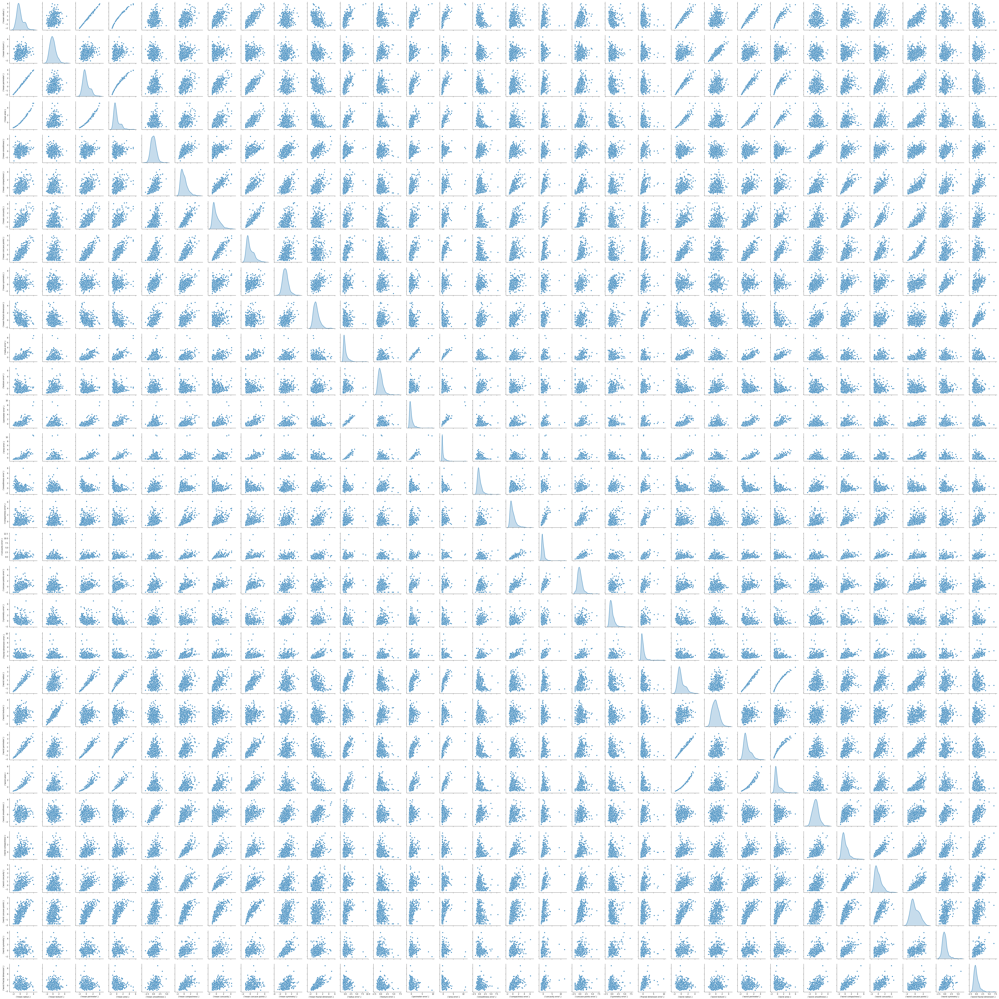

In [212]:
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sb

#sb.pairplot(patients_data_p, diag_kind="kde")
sb_plot_scaled = sb.pairplot(patients_data_p_scaled, diag_kind="kde")
sb_plot_scaled.savefig("wykresy2.png")

# Split data in train and test batches

In [237]:
from sklearn.model_selection import train_test_split

patients_train_data, patients_test_data, \
patients_train_target, patients_test_target = \
train_test_split(scaled_data, patients['target'], test_size=0.1)

In [238]:
print("Training dataset:")
print("patients_train_data:", patients_train_data.shape)
print("patients_train_target:", patients_train_target.shape)

Training dataset:
patients_train_data: (512, 30)
patients_train_target: (512,)


KOMENTARZ: Liczba elementów zbioru treningowego wynosi 512.

In [239]:
print("Testing dataset:")
print("patients_test_data:", patients_test_data.shape)
print("patients_test_target:", patients_test_target.shape)

Testing dataset:
patients_test_data: (57, 30)
patients_test_target: (57,)


KOMENTARZ: Liczba elementów zbioru testującego wynosi 57.

# Initiate and train model on training data 

In [240]:
from sklearn.linear_model import LogisticRegression

logistic_regression = LogisticRegression()
logistic_regression.fit(patients_train_data, patients_train_target)

D:\Python\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

# Model evaluation

In [241]:
from sklearn.metrics import mean_squared_error
print("Mean squared error of a learned model: %.2f" % 
      mean_squared_error(patients_test_target, logistic_regression.predict(patients_test_data)))

Mean squared error of a learned model: 0.04


KOMENTARZ: Mean squared error to błąd średniokwadratowy. Jest to średnia różnica kwadratów odchyleń. Błąd średniokwadratowy niewiele nam mówi, natomiast ważne jest, aby był jak najmniejszy.

Determining Coefficient of determination with r2_score()

In [242]:
from sklearn.metrics import r2_score
print('Variance score: %.2f' % r2_score(patients_test_target, logistic_regression.predict(patients_test_data)))

Variance score: 0.86


KOMENTARZ: Variance score to wartość wariancji. Wariancja to średnia arytmetyczna kwadratów odchyleń od ich średniej arytmetycznej. Im wartość wariancji jest większa od 0,6 to tym lepiej. W naszym przypadku wynosi ona 0,86, zatem model regresji logistycznej jest dobry.

# Model evaluation with cross-validation

In [243]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(LogisticRegression(), scaled_data, patients['target'], cv=4)
print(scores)

[0.97202797 0.97887324 0.97183099 0.98591549]


D:\Python\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
D:\Python\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
D:\Python\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
D:\Python\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


KOMENTARZ: Cross_validation to sprawdzian krzyżowy, inaczej kroswalidacja. Idea tej metody polega na podzieleniu zbioru uczącego na możliwie równe podzbiory, a następnie stworzeniu pseudopróby uczącej poprzez usunięcie ze zbioru wejściowego jednego z k-podzbiorów i potraktowanie go jako zbioru testowego. Powtarzając powyższy proces k razy i obliczając statystyki na zbiorach testowych tak zbudowanych modeli możliwa jest estymacja błędu generalizacji modelu. W naszym przypadku wykonywane są 4 iteracje (cv=4) i w każdej z nich z sumy elementów uczących i testujących 3/4 tej sumy są brane jak zbiór uczący, a 1/4 tej sumy jako zbiór testujący. Jak widać powyżej wszystkie cztery wartości są bardzo zblizone do siebie. Największa z nich wynosi: 0.98591549, natomiast najmniejsza: 0.97183099.

# Using classifier

In [244]:
id=5
prediction = logistic_regression.predict(patients_test_data[id,:].reshape(1,-1))
print("Model predicted for patient {0} value {1}".format(id, prediction))

print("Real value for patient \"{0}\" is {1}".format(id, patients_test_target[id]))

Model predicted for patient 5 value [0]
Real value for patient "5" is 0


KOMENTARZ: Jest to klasyfikacja binarna, która przyjmuje jedną z dwóch wartości: {0, 1}. 0 oznacza, że pacjent ma łagodną zmianę rakową (jest zdrowy), a 1 oznacza, że pacjent ma złośliwą zmianę rakową (jest chory). Model dla pacjenta numer 5 przewidział wartość 1, czyli pacjent ma złośliwą zmianę rakową (jest chory). A wartość prawdziwa dla tego pacjenta również wynosi 1.

In [245]:
prediction_probability = logistic_regression.predict_proba(patients_test_data[id,:].reshape(1,-1))
print(prediction_probability)

[[9.99997364e-01 2.63585905e-06]]


KOMENTARZ: Prawdopodobieństwo, że pacjent należy do klasy 0 (jest zdrowy) wynosi 0,00423621, a prawdopodobieństwo, że należy do klasy 1 (jest chory) wynosi 0,99576379.

# Evaluate a classifier using model accuracy

In [246]:
from sklearn.metrics import accuracy_score
acc = accuracy_score(patients_test_target, logistic_regression.predict(patients_test_data))
print("Model accuracy is {0:0.2f}".format(acc))

Model accuracy is 0.96


KOMENTARZ: Model accuracy to współczynnik dokładności. Nie wiele on mówi o wytrenowanym modelu, ale ważne jest, aby był jak najbliżej wartości 1. W tym przypadku współczynnik dokładności wynosi 0,96, a więc można powiedzieć, że jest to bardzo dobry wynik.

# Evaluating classifier using confusion matrix

In [247]:
from sklearn.metrics import confusion_matrix

conf_matrix = confusion_matrix(patients_test_target, logistic_regression.predict(patients_test_data))
print(conf_matrix)

[[27  2]
 [ 0 28]]


KOMENTARZ: Confusion matrix to macierz konfuzji (macierz błedu/pomyłek). Macierz konfuzji jest podstawowym narzędziem stosowanym do oceny jakości klasyfikacji. W tym zadaniu brana pod uwagę była klasyfikacja binarna (dwie klasy) i następujące kodowanie klas: 1 - positive: pacjent posiada złośliwą zmianę rakową, 0 - negative: pacjent posiada łagodną zmianę rakową.

Macierz konfuzji powstaje z przecięcia klasy prognozowanej i klasy faktycznie zaobserwowanej - mamy zatem 4 przypadki (2 dla zgodności i 2 dla niezgodności prognozy ze stanem faktycznym). W tym przypadku: a. komórka 0x0: 20 - true-positive (TP - prawdziwie pozytywna) - przewidywanie pozytywne, faktycznie zaobserwowana klasa pozytywna (pozytywny wynik testu na raka i faktycznie posiadana złośliwa zmiana rakowa), b. komórka 0x1: 2 - false-positive (FP - fałszywie pozytywna) - przewidywanie pozytywne, faktycznie zaobserwowana klasa negatywna (pozytywny wynik testu na raka i faktyczny brak złośliwej zmiany rakowej), c. komórka 1x0: 1 - false-negative (FN - fałszywie negatywna) - przewidywanie negatywne, faktycznie zaobserwowana klasa pozytywna (negatywny wynik testu na raka i faktyczne posiadanie złośliwej zmiany rakowej), d. komórka 1x1: 34 - true-negative (TN - prawdziwie negatywna) - przewidywanie negatywne, faktycznie zaobserwowana klasa negatywna (negatywny wynik testu na raka i faktycznie brak złośliwej zmiany rakowej).

Czyli w sumie model pomylił się w 2 przypadkach na 57 przypadków (ze zbioru testującego).